# 各种投影方式的地图

库介绍：[pygmt](https://www.pygmt.org/dev/install.html)

In [1]:
# 新增
import pygmt  #注意：将pygmt写在最前面，避免出现不必要的问题
import linecache

import pandas as pd
import numpy as np
from matplotlib.ticker import MultipleLocator
import matplotlib as mpl
mpl.rcParams["font.family"] = 'Arial'  #默认字体类型
mpl.rcParams["mathtext.fontset"] = 'cm' #数学文字字体
mpl.rcParams["contour.negative_linestyle"] = 'dashed'  #默认字体类型
import matplotlib.pyplot as plt
import os
from netCDF4 import Dataset


## 1. 不同投影类型

参见 [gmt文档](https://docs.generic-mapping-tools.org/6.0/cookbook/map_projections.html)

### 1.1 全球地图投影

In [2]:
projections_name=['Hammer','Mollweide','Winkel Tripel','Robinson','Eckert IV','Eckert VI',
                  'Sinusoidal','Van der Grinten','Hemisphere','Orthographic','Gnomonic','Cylindrical equidistant']
projections=['H','W','R','N','Kf','Ks','I','V','A280/30/','G-75/41/','F-120/35/60/','Q']
for proj_name, proj in zip(projections_name,projections):
    fig = pygmt.Figure()
    pygmt.config(MAP_GRID_PEN_PRIMARY="0.25p,black",
             FORMAT_GEO_MAP="ddd:mm:ssF MAP_FRAME_WIDTH 3p",
             FONT_ANNOT_PRIMARY="7p",
             FONT_TITLE="11p,Helvetica,black",
             FONT_LABEL="8p,Helvetica",
             MAP_LABEL_OFFSET="4p")
    # Make a global Mollweide map with automatic ticks
    fig.basemap(region="g", projection=proj+'12c',B=str('+t"%s projection"'%(proj_name)))
    # Plot the land as light gray
    fig.coast(land="tomato1", water="skyblue",frame='afg')
    fig.savefig('../../figures/Chapter3/Lecture3_map_global_'+proj_name.replace(' ','_')+'.pdf',show=False)
    fig.show()

### 1.2. 区域地图投影

In [62]:
projections_name=['Albers conic equal-area','Equidistant conic','Lambert conic conformal','Mercator']
projections=['B','D','L','M']
regions = [[70,138,13,56],[-88, -70,18,24],[-130, -70, 24, 52],[70,138,13,56]]
for proj_name, proj in zip(projections_name,projections):
    fig = pygmt.Figure()
    pygmt.config(MAP_GRID_PEN_PRIMARY="0.25p,black",
             FORMAT_GEO_MAP="ddd:mm:ssF MAP_FRAME_WIDTH 3p",
             FONT_ANNOT_PRIMARY="7p",
             FONT_LABEL="8p,Helvetica",
             FONT_TITLE="11p,Helvetica,black",
             MAP_LABEL_OFFSET="4p")
    # Make a global Mollweide map with automatic ticks
    if(proj=='M'):
        projection=proj+'12c'
    else:
        projection=proj+str('%f/%f/%f/%f/12c'%((region[0]+region[1])/2, (region[2]+region[3])/2, region[2],region[3]))
    fig.basemap(region=region, projection=projection,frame=True)
    # Plot the land as light gray
    fig.coast(land="tomato1", water="skyblue",B=str('+t"%s projection"'%(proj_name)))
    fig.savefig('../../figures/Chapter3/Lecture3_map_regional_'+proj_name.replace(' ','_')+'.pdf',show=False)
    fig.show()

## 2. 绘制中国地图

部分数据来自[GMT中文社区](https://gmt-china.org/data/)

In [2]:
# 区域范围
region = [70,138,13,56]
# 读取省会城市坐标
captials=np.loadtxt('Data/China/CN-capitals_EN.dat',skiprows=1,usecols=(0,1))

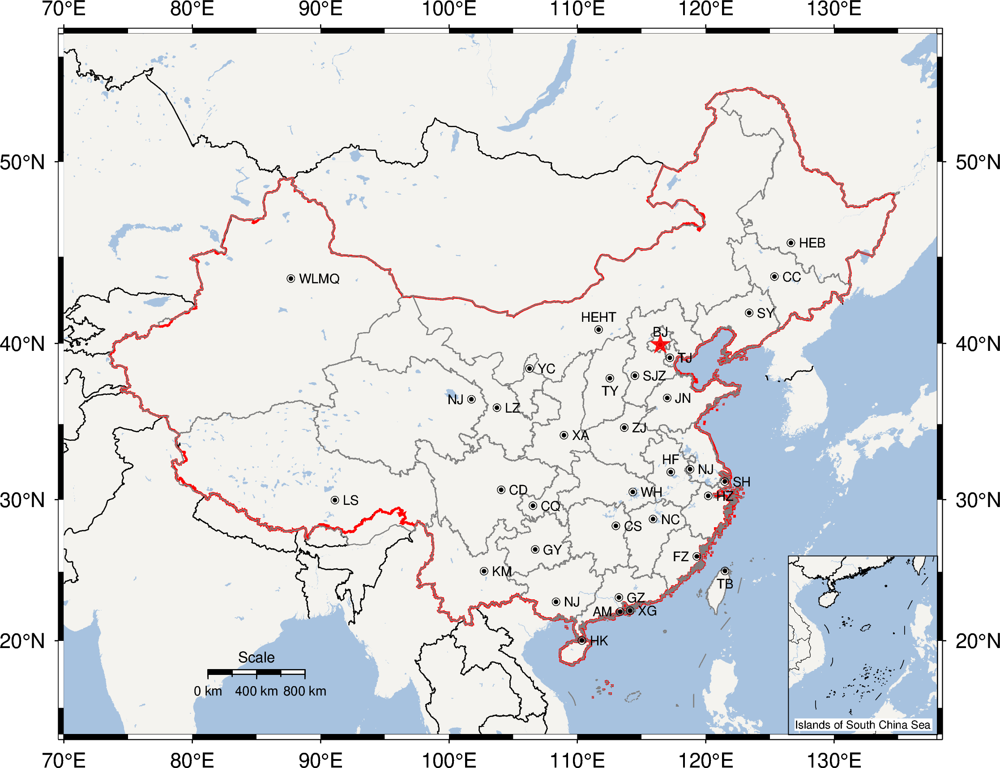

In [13]:
fig = pygmt.Figure()
# 全局默认设置
pygmt.config(MAP_GRID_PEN_PRIMARY="0.25p,gray,2_2:1",
             FORMAT_GEO_MAP="ddd:mm:ssF MAP_FRAME_WIDTH 3p",
             FONT_ANNOT_PRIMARY="7p",
             FONT_LABEL="8p,Helvetica",
             MAP_LABEL_OFFSET="4p")
projections=['D105/35/36/42/7.5i','M105/35/6.5i']
with pygmt.config(FONT_ANNOT_PRIMARY='11p'):
    fig.basemap(region=region, projection=projections[1], frame='10f5')
fig.coast(borders=["1/0.5p,black", "2/0.5p,red", "3/0.5p,blue"],land="244/243/239", water="167/194/223",L="g85/17.5+c17.5+w800k+f+u+lScale")
fig.coast(E='CN+p1p,red')
# 1.边界
fig.plot(data='Data/China/CN-border-La.dat', pen="0.4p,gray50")
# 2. 省会坐标
fig.plot(x=captials[:,0], y=captials[:,1], style="c0.08c", color="black")
fig.plot(x=captials[:,0], y=captials[:,1], style="c0.15c", pen="0.2p,black")
# 3. 省会城市名称
fig.text(textfiles='Data/China/CN-capitals_EN.dat',F='+f7p,Helvetica+j',D='j0.15c/0.15c')
# 4.标记北京所在位置
fig.plot(x=116.46, y=39.92, style="a0.4c", color="red@10")
# 5. 铁路
# fig.plot(data='Data/China/CN-Railways.dat',pen='1p,black')
# fig.plot(data='Data/China/CN-Railways.dat',pen='0.6p,white,8_8:')

# 绘制南海区域
with pygmt.config(MAP_FRAME_PEN="1p", MAP_FRAME_TYPE="plain"):
    fig.basemap(region=[105,123,3,24], projection="M1.1i", frame='0',X='5.4i')
    fig.coast(N='1/0.1p',land='244/243/239',water='167/194/223')
    fig.plot(data='Data/China/CN-border-La.dat', pen="0.25p")
    fig.text(position='BC',text='Islands of South China Sea',F='+f6p,Helvetica',fill='white',D='0c/0.1c')

    
# show and save
fig.savefig('../../figures/Chapter3/Lecture3_1_MAP_CN.pdf',show=False)
fig.show()

## 3. 中国地图上进行数据可视化

### 曲线、散点、文字、等值线图、色彩图、色阶条

In [165]:
# 1. 获取城市的名称及经纬度坐标
provinces_name_pos_data={}
alldata=linecache.getlines('Data/China/CN-capitals.dat')
for i in range(1,len(alldata)):
    data=alldata[i].split()
    provinces_name_pos_data[data[4]]={'lon':data[0],'lat':data[1],'confirm':0} #  np.array([data[0],data[1]])
provinces=provinces_name_pos_data.keys()
# print(len(provinces),provinces)
linecache.clearcache()
# 2. 获取省份的新冠数据
COVID_path='Data/COVID-19/Data/China_Chinese'
files_covid=os.listdir(COVID_path)
date='2020-02-01'
data=pd.read_csv(COVID_path+'/'+date+'.csv')
keys_data=data.columns
print(keys_data)
names=data[keys_data[1]].values
lon=np.zeros_like(names,dtype=float)
lat=np.zeros_like(names,dtype=float)
confirm=np.log10(data[keys_data[2]].values)
for i in range(0,len(names)):
    names[i]=names[i].replace(' ','')
    #print(names[i],captials_name_pos[names[i]])
    lon[i]=float(provinces_name_pos_data[names[i]]['lon'])
    lat[i]=float(provinces_name_pos_data[names[i]]['lat'])
    provinces_name_pos_data[names[i]]['confirm']=confirm[i]
data['lon']=lon
data['lat']=lat

Index(['序号', ' 名称', ' 确诊', ' 死亡', ' 治愈', ' '], dtype='object')


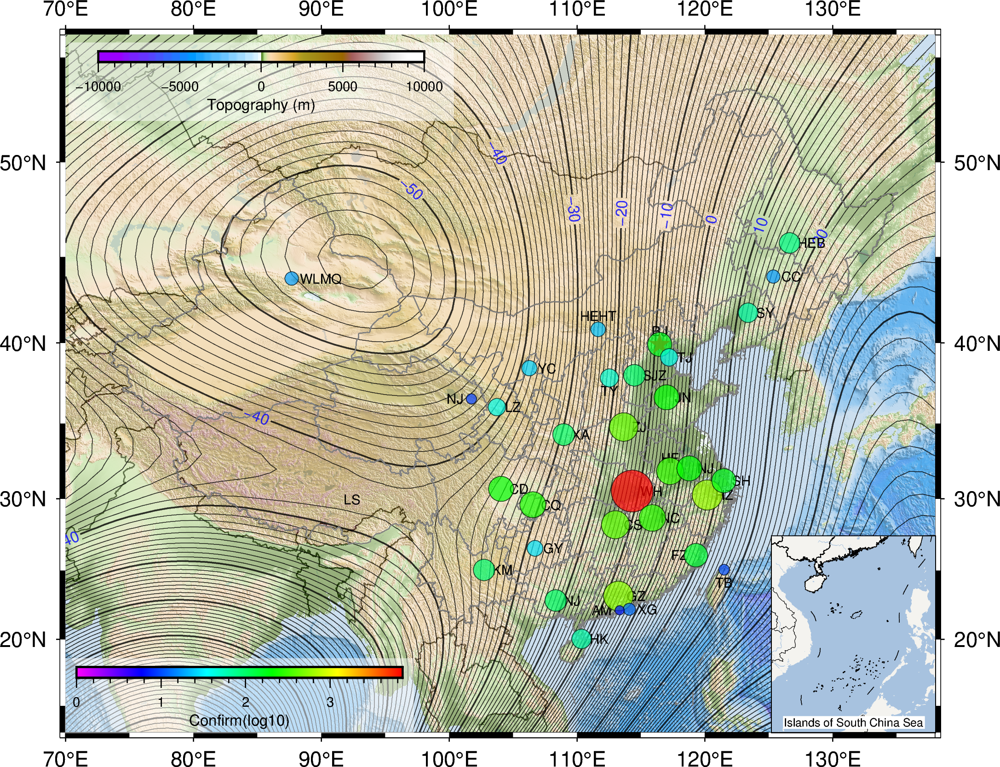

In [166]:
fig = pygmt.Figure()
# 全局默认设置
pygmt.config(MAP_GRID_PEN_PRIMARY="0.25p,gray,2_2:1",
             FORMAT_GEO_MAP="ddd:mm:ssF MAP_FRAME_WIDTH 3p",
             FONT_ANNOT_PRIMARY="7p",
             FONT_LABEL="8p,Helvetica",
             MAP_LABEL_OFFSET="4p")
figwidth=16
region=[70,138,13,56]
projections=['D105/35/36/42/7.5i',str('M105/35/%.0fc'%(figwidth))]
with pygmt.config(FONT_ANNOT_PRIMARY='11p'):
    fig.basemap(region=region, projection=projections[1], frame='10f5')
fig.coast(borders=["1/0.5p,black", "2/0.5p,red", "3/0.5p,blue"],land="244/243/239", water="167/194/223")
# 绘制地形图
# ----------------如果有全球ETOPO1数据并安装了GMT才可执行下面三行代码----------------------------------------
# pygmt.grdcut(grid='Data/Global/geoid.nc',outgrid='Data/China/geoid.nc',region=region)
# pygmt.grdcut(grid='Data/Global/ETOPO10.nc',outgrid='Data/China/ETOPO.nc',region=region)
# os.system('gmt grdgradient Data/China/ETOPO.nc -Ne0.7 -A50 -GData/China/ETOPO_grad.nc')
# os.system('gmt grd2cpt Data/China/ETOPO.nc -Cglobe -T-10000/10000/200 -Z -D>Data/China/ETOPO.cpt')
os.system('gmt grd2cpt Data/China/geoid.nc -Crainbow -T-92/55/10 -Z -D>Data/China/geoid.cpt')
# ----------------------------------------------------------------------------------------------------
fig.grdimage('Data/China/ETOPO.nc',I='Data/China/ETOPO_grad.nc',C='Data/China/ETOPO.cpt',t='50')
fig.grdcontour('Data/China/geoid.nc',C='1',t='20',A='10+f8p,Helvetica,blue')
# 1.边界
fig.plot(data='Data/China/CN-border-La.dat', pen="0.4p,gray50")
# 2. 省会坐标
# fig.plot(x=captials[:,0], y=captials[:,1], style="c0.08c", color="black")
# fig.plot(x=captials[:,0], y=captials[:,1], style="c0.15c", pen="0.2p,black")
# 3. 省会城市名称
fig.text(textfiles='Data/China/CN-capitals_EN.dat',F='+f7p,Helvetica+j',D='j0.15c/0.15c')
# 4.标记北京所在位置
fig.plot(x=116.46, y=39.92, style="a0.4c", color="red@10")
# 绘制新冠数据：确诊
pygmt.makecpt(cmap="rainbow", series=[np.min(confirm), np.max(confirm)+0.001],output='covid.cpt')
fig.plot(x=data.lon,y=data.lat,sizes=confirm/5,color=confirm,cmap='covid.cpt',style="cc",pen="black",t='30')
# # 填充颜色
# fig.plot(data='Data/China/CN-border-La.dat', pen="0.4p,gray50",cmap='covid.cpt')

with pygmt.config(MAP_FRAME_PEN="1p"):
    fig.colorbar(D='jLB+w6c/0.2c+o0.2c/1c+h',cmap='covid.cpt',frame='af+l"Confirm(log10)"',F='+gwhite@50')
    fig.colorbar(D='jLT+w6c/0.2c+o0.6c/0.3c+h',cmap='Data/China/ETOPO.cpt',frame='af+l"Topography (m)"',F='+gwhite@50')
# 绘制南海区域
figwidth_inset=3
with pygmt.config(MAP_FRAME_PEN="1p", MAP_FRAME_TYPE="plain"):
    fig.basemap(region=[105,123,3,24], projection=str("M%.0fc"%(figwidth_inset)), frame='0',X=str('%.0fc'%(figwidth-figwidth_inset)))
    fig.coast(N='1/0.1p',land='244/243/239',water='167/194/223')
    fig.plot(data='Data/China/CN-border-La.dat', pen="0.25p")
    fig.text(position='BC',text='Islands of South China Sea',F='+f6p,Helvetica',fill='white',D='0c/0.1c')

    
# show and save
fig.savefig('../../figures/Chapter3/Lecture3_1_MAP_CN_Etopo_Geoid_Covid.pdf',show=True)
fig.show()

### 为省份区域填色

34 34


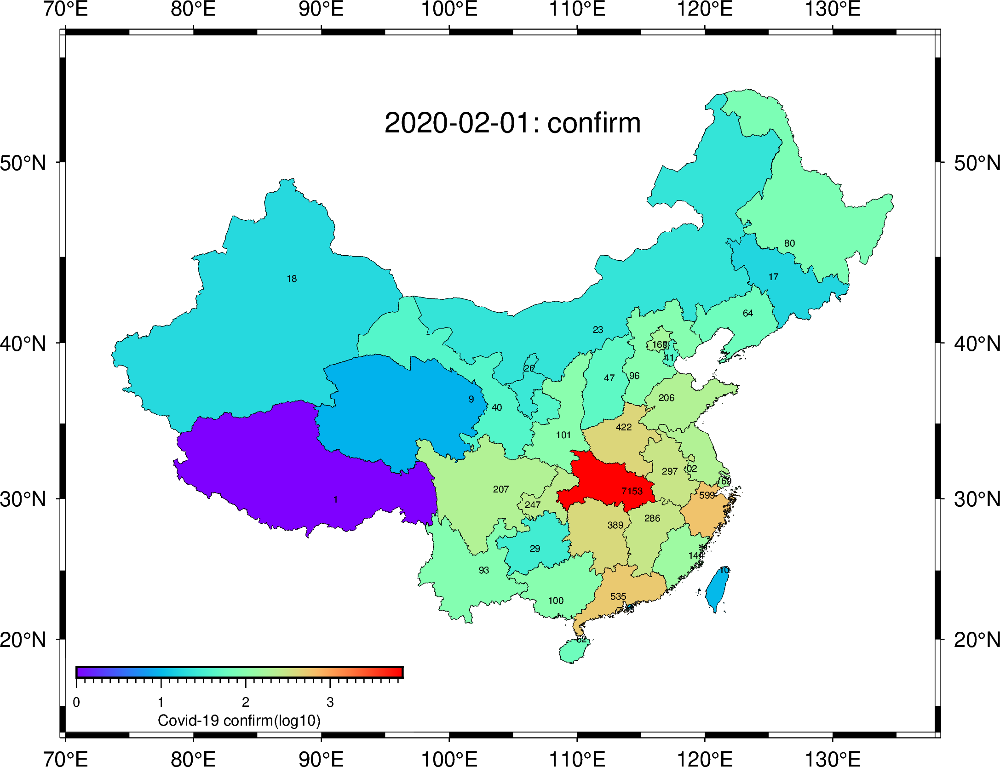

In [171]:
# 获取省份的经纬度和全球行政区数据中的代码
provinces_name_code={}
provinces_names=[]
provinces_code=[]
alldata=linecache.getlines('Data/China/CN-capitals.dat')
for i in range(1,len(alldata)):
    data=alldata[i].split()
    provinces_name_code[data[4]]={'code':data[5]}
    provinces_names.append(data[4])
    provinces_code.append(data[5])
provinces_code=np.array(provinces_code,dtype=int)
print(len(provinces_names),len(provinces_code))
# =============绘图==================
fig = pygmt.Figure()
# 全局默认设置
pygmt.config(MAP_GRID_PEN_PRIMARY="0.25p,gray,2_2:1",
             FORMAT_GEO_MAP="ddd:mm:ssF MAP_FRAME_WIDTH 3p",
             FONT_ANNOT_PRIMARY="7p",
             FONT_LABEL="8p,Helvetica",
             MAP_LABEL_OFFSET="4p")
figwidth=16
region=[70,138,13,56]
projections=['D105/35/36/42/7.5i',str('M105/35/%.0fc'%(figwidth))]
with pygmt.config(FONT_ANNOT_PRIMARY='11p'):
    fig.basemap(region=region, projection=projections[1], frame='10f5')

# 根据确诊人数归一化颜色
norm = mpl.colors.Normalize(vmin=np.min(confirm), vmax=np.max(confirm))
# write cpt file
color_nodes=np.linspace(norm.vmin,norm.vmax,20)
fpout=open('covid_cn.cpt','w')
for i in range(0,len(color_nodes)-1):
    value1=color_nodes[i]
    value2=color_nodes[i+1]
    rgb1=mpl.cm.rainbow(norm(value1),bytes=True) 
    rgb2=mpl.cm.rainbow(norm(value2),bytes=True) 
    fpout.write('%f %.0f/%.0f/%.0f %f %.0f/%.0f/%.0f\n'%(value1, rgb1[0],rgb1[1],rgb1[2],value2, rgb2[0],rgb2[1],rgb2[2]))
fpout.close()
# 日期
fig.text(x=105,y=52,text=date+': confirm',font='15p,Helvetica,black')
for i in range(0,len(provinces_code)):
    code=provinces_code[i]
    province_name=provinces_names[i]
    confirm_province=provinces_name_pos_data[province_name]['confirm']
    rgba_color = mpl.cm.rainbow(norm(confirm_province),bytes=True) 
    fig.coast(E=str('CN.%s+p0.05p+g%.0f/%.0f/%.0f'%(code,rgba_color[0],rgba_color[1],rgba_color[2])))
    fig.text(x=provinces_name_pos_data[province_name]['lon'],y=provinces_name_pos_data[province_name]['lat'],
             text=str('%.0f'%(10**confirm_province)),font='5p,Helvetica,black')
with pygmt.config(MAP_FRAME_PEN="1p"):
    fig.colorbar(D='jLB+w6c/0.2c+o0.2c/1c+h',cmap='covid_cn.cpt',frame='a1f0.1+l"Covid-19 confirm(log10)"',F='+gwhite@90',B='y+l"ds"')
# show and save
fig.savefig('../../figures/Chapter3/Lecture3_1_MAP_CN_Sheng.pdf',show=True)
fig.show()

## 练习
绘制全球不同国家和地区的新冠数据（如确诊数量）：以区域填色的形式可视化

Index(['序号', ' 名称', ' 确诊', ' 死亡', ' 治愈', ' '], dtype='object')


coast [WARNING]: No country code matching nan (skipped)


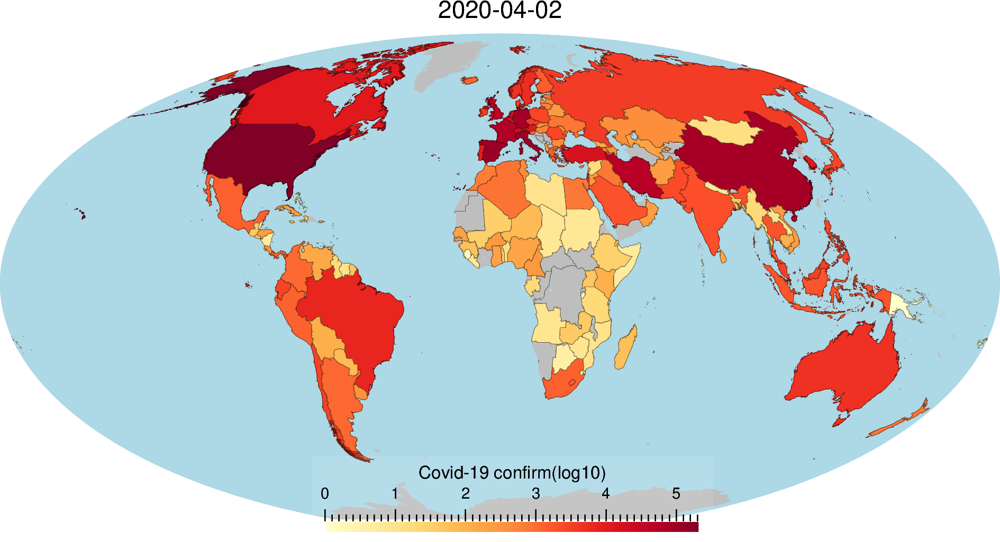

In [163]:
# 读取国家代码，e.g. 中国=CN
countries_name_code=pd.read_csv('Data/COVID-19/Data/countryCode.csv')
keys=countries_name_code.keys()
countries=countries_name_code['国家或地区'].values
codes=countries_name_code['国际域名缩写'].values
code_countries={}
for name, code in zip(countries,codes):
    code_countries[name]=code

# 读取COVID-19数据
date='2020-04-02'
data_covid=pd.read_csv('Data/COVID-19/Data/Global_Chinese/'+date+'.csv')
keys_covid=data_covid.columns
print(keys_covid)
countries_covid={}
names=data_covid[keys_covid[1]].values
confirms=data_covid[keys_covid[2]].values
deaths=data_covid[keys_covid[2]].values
max_confirm,max_death=np.max(confirms),np.max(deaths)
for name, confirm,death in zip(names,confirms ,deaths):
    countries_covid[name.replace(' ','')]={'confirm':confirm,'death':death}
country_names_covid=countries_covid.keys()
# 根据确诊人数归一化颜色
norm = mpl.colors.Normalize(vmin=np.log10(np.min(confirms)), vmax=np.log10(np.max(confirms)))
# write cpt file
color_nodes=np.linspace(norm.vmin,norm.vmax,20)
fpout=open('covid_global.cpt','w')
for i in range(0,len(color_nodes)-1):
    value1=color_nodes[i]
    value2=color_nodes[i+1]
    rgb1=mpl.cm.YlOrRd(norm(value1),bytes=True) 
    rgb2=mpl.cm.YlOrRd(norm(value2),bytes=True) 
    fpout.write('%f %.0f/%.0f/%.0f %f %.0f/%.0f/%.0f\n'%(value1, rgb1[0],rgb1[1],rgb1[2],value2, rgb2[0],rgb2[1],rgb2[2]))
fpout.close()
# 绘图
projections_name=['Hammer','Mollweide','Winkel Tripel','Robinson','Eckert IV','Eckert VI',
                  'Sinusoidal','Van der Grinten','Hemisphere','Orthographic','Gnomonic','Cylindrical equidistant']
projections=['H','W','R','N','Kf','Ks','I','V','A280/30/','G-75/41/','F-120/35/60/','Q']
ind_proj=1
proj=projections[ind_proj]
proj_name=projections_name[ind_proj]
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN_PRIMARY="0.25p,black",
         FORMAT_GEO_MAP="ddd:mm:ssF MAP_FRAME_PEN thin,white ",
         FONT_ANNOT_PRIMARY="7p",
         FONT_TITLE="11p,Helvetica,black",MAP_TITLE_OFFSET='-8p',
         FONT_LABEL="8p,Helvetica",
         MAP_LABEL_OFFSET="4p")
# Make a global Mollweide map with automatic ticks
fig.basemap(region="g", projection=proj+'0/16c',B=str('+t"%s"'%(date)))
# Plot the land as light gray
fig.coast(borders=['1/0.01p,black@50'],shorelines=['1/0.01p,black@100'],water='lightblue',land='gray')
# plot confirm data for each country or region
for country in country_names_covid:
    if(not (country in countries)):
        continue
    confirm=countries_covid[country]['confirm']
    code=code_countries[country]
    rgba_color = mpl.cm.YlOrRd(norm(np.log10(confirm)),bytes=True) 
    if(code==' '):
        continue
    fig.coast(E=str('%s+p0.01p,black@50+g%.0f/%.0f/%.0f'%(code,rgba_color[0],rgba_color[1],rgba_color[2])))

with pygmt.config(MAP_FRAME_PEN="1p"):
    fig.colorbar(D='jCB+w6c/0.2c+o0.2c/0c+h',cmap='covid_global.cpt',frame='a1f0.1+l"Covid-19 confirm(log10)"',F='+gwhite@90',B='y+l"ds"')
    
fig.savefig('../../figures/Chapter3/Lecture3_map_global_COVID_'+proj_name.replace(' ','_')+'.pdf',show=True)
fig.show()